In [1]:
# Import Modules

from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
# from rasterio.plot import plotting_extent
# from rasterio.plot import show
# from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from spectral import *


import plotly.graph_objects as go

np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [2]:
import spectral.io.envi as envi
from find_path_nextcloud import find_path_nextcloud


path_nextcloud = find_path_nextcloud()
path_folder = path_nextcloud + 'Daten_Gyrocopter/Dessau/Hyperspektral/'
file_name = 'Dessau_unsigned_mosaik_all.hdr'

path_file = path_folder + file_name

In [3]:
# Read Header-Info (.hdr)
file_hdr = envi.open(path_file)
file_hdr

	Data Source:   'C:/Users/fgrassxx/Nextcloud/Master_Data_Science/2_Semester/Projekt_Data_Science_1_SS22/Daten_Gyrocopter/Dessau/Hyperspektral/Dessau_unsigned_mosaik_all.dat'
	# Rows:          10211
	# Samples:        9454
	# Bands:            80
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16

In [4]:
# Ausgabe Übersicht Header
print('Anzahl Bänder:', len(file_hdr.bands.centers))
print('Einheit Bänder:', file_hdr.bands.band_unit)
print('Wellenlängenbereich von', round(min(file_hdr.bands.centers)), 'bis', round(max(file_hdr.bands.centers)))

Anzahl Bänder: 80
Einheit Bänder: Nanometers
Wellenlängenbereich von 416 bis 991


In [5]:
print('Metadaten')
file_meta = file_hdr.metadata

Metadaten


In [6]:
file_meta['map info']

['UTM',
 '1.000',
 '1.000',
 '306984.850',
 '5749110.050',
 '3.000000e-001',
 '3.000000e-001',
 '33',
 'North',
 'WGS-84',
 'units=Meters']

In [7]:

path_nextcloud = find_path_nextcloud()
path_folder = path_nextcloud + 'Daten_Gyrocopter/Dessau/Hyperspektral/'


path_hdr = path_folder + 'Dessau_unsigned_mosaik_all.hdr'
path_dat =  path_folder + 'Dessau_unsigned_mosaik_all.dat'

img = envi.open(file=path_hdr, image=path_dat)

In [8]:
img

	Data Source:   'C:/Users/fgrassxx/Nextcloud/Master_Data_Science/2_Semester/Projekt_Data_Science_1_SS22/Daten_Gyrocopter/Dessau/Hyperspektral/Dessau_unsigned_mosaik_all.dat'
	# Rows:          10211
	# Samples:        9454
	# Bands:            80
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16

In [9]:
img = open_image(file=path_hdr)

In [10]:
img.__class__

spectral.io.bsqfile.BsqFile

In [11]:
img.shape


(10211, 9454, 80)

In [12]:
print(img)

	Data Source:   'C:/Users/fgrassxx/Nextcloud/Master_Data_Science/2_Semester/Projekt_Data_Science_1_SS22/Daten_Gyrocopter/Dessau/Hyperspektral/Dessau_unsigned_mosaik_all.dat'
	# Rows:          10211
	# Samples:        9454
	# Bands:            80
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16


In [13]:
pixel = img[4500:5500,4500:5500]

pixel.shape

(1000, 1000, 80)

In [14]:
bands = img[:,:,5]
bands.shape

(10211, 9454, 1)

In [15]:
arr = img.load()
arr.__class__

spectral.image.ImageArray

In [16]:
print(arr.info())


	# Rows:          10211
	# Samples:        9454
	# Bands:            80
	Data format:   float32


In [17]:
arr.shape

(10211, 9454, 80)

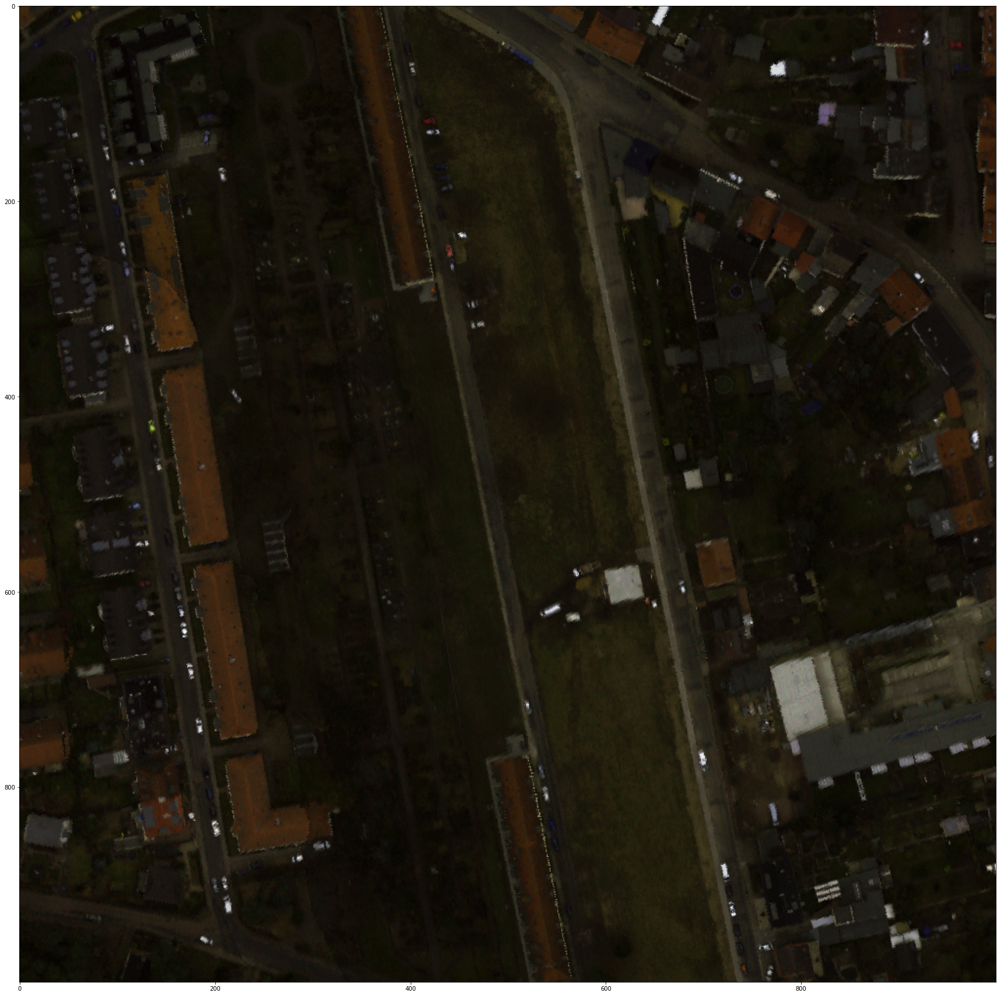

In [18]:
view = imshow(pixel,(27,21,4), figsize=(30,50))

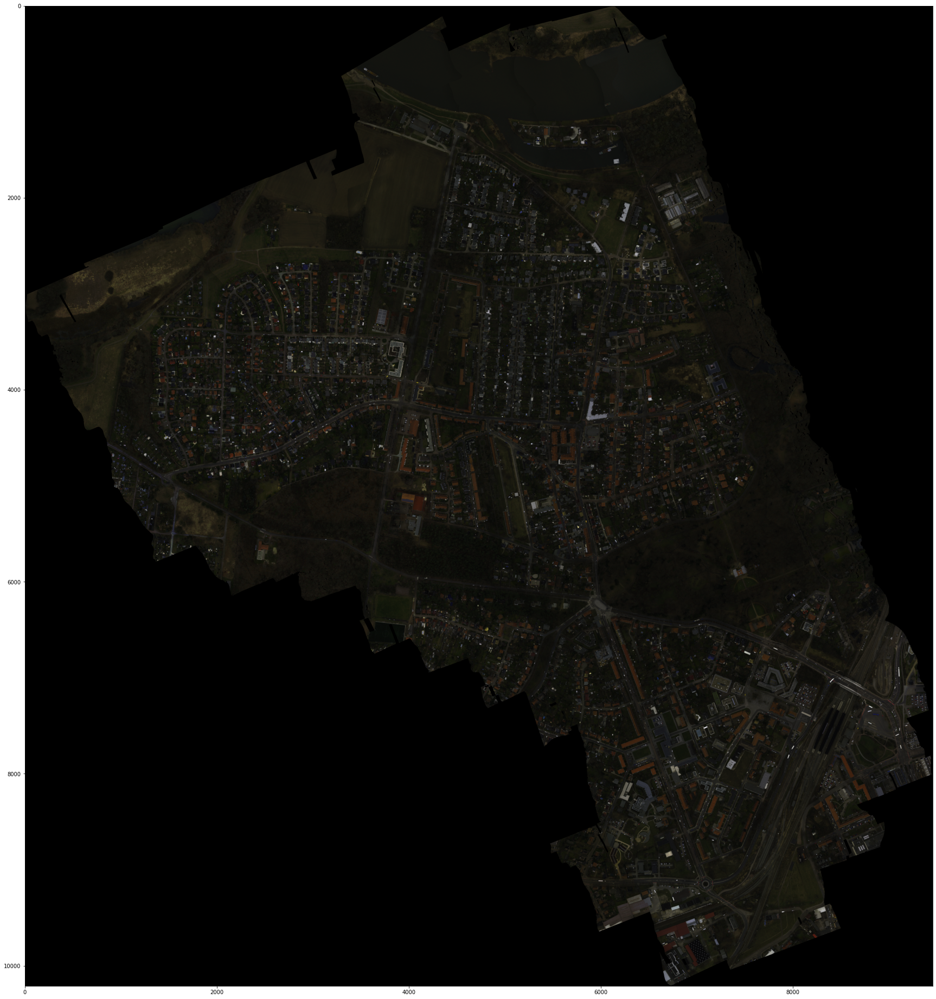

In [19]:
view = imshow(arr,(27,21,4), figsize=(30,50))



In [20]:
save_rgb(filename = 'Ausschnitt_Dessau_rgb.jpg', data = pixel, bands=(27,21,4))

In [21]:
save_rgb(filename = 'Dessau_rgb.jpg', data = arr, bands=(27,21,4))

In [22]:
# Für Oldenburg

path_nextcloud = find_path_nextcloud()
path_folder = path_nextcloud + 'Daten_Gyrocopter/Oldenburg/Hyperspektral/'


path_hdr = path_folder + 'Oldenburg-all.hdr'
path_dat =  path_folder + 'Oldenburg-all.dat'

img = envi.open(file=path_hdr, image=path_dat)

In [23]:
img

	Data Source:   'C:/Users/fgrassxx/Nextcloud/Master_Data_Science/2_Semester/Projekt_Data_Science_1_SS22/Daten_Gyrocopter/Oldenburg/Hyperspektral/Oldenburg-all.dat'
	# Rows:           1980
	# Samples:        3500
	# Bands:           107
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16

In [24]:
img = open_image(file=path_hdr)

In [25]:
img.__class__

spectral.io.bsqfile.BsqFile

In [26]:
img.shape


(1980, 3500, 107)

In [27]:
print(img)

	Data Source:   'C:/Users/fgrassxx/Nextcloud/Master_Data_Science/2_Semester/Projekt_Data_Science_1_SS22/Daten_Gyrocopter/Oldenburg/Hyperspektral/Oldenburg-all.dat'
	# Rows:           1980
	# Samples:        3500
	# Bands:           107
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16


In [28]:
pixel = img[500:1000,500:1000]

pixel.shape

(500, 500, 107)

In [29]:
bands = img[:,:,5]
bands.shape

(1980, 3500, 1)

In [30]:
arr = img.load()
arr.__class__

spectral.image.ImageArray

In [31]:
print(arr.info())


	# Rows:           1980
	# Samples:        3500
	# Bands:           107
	Data format:   float32


In [32]:
arr.shape

(1980, 3500, 107)

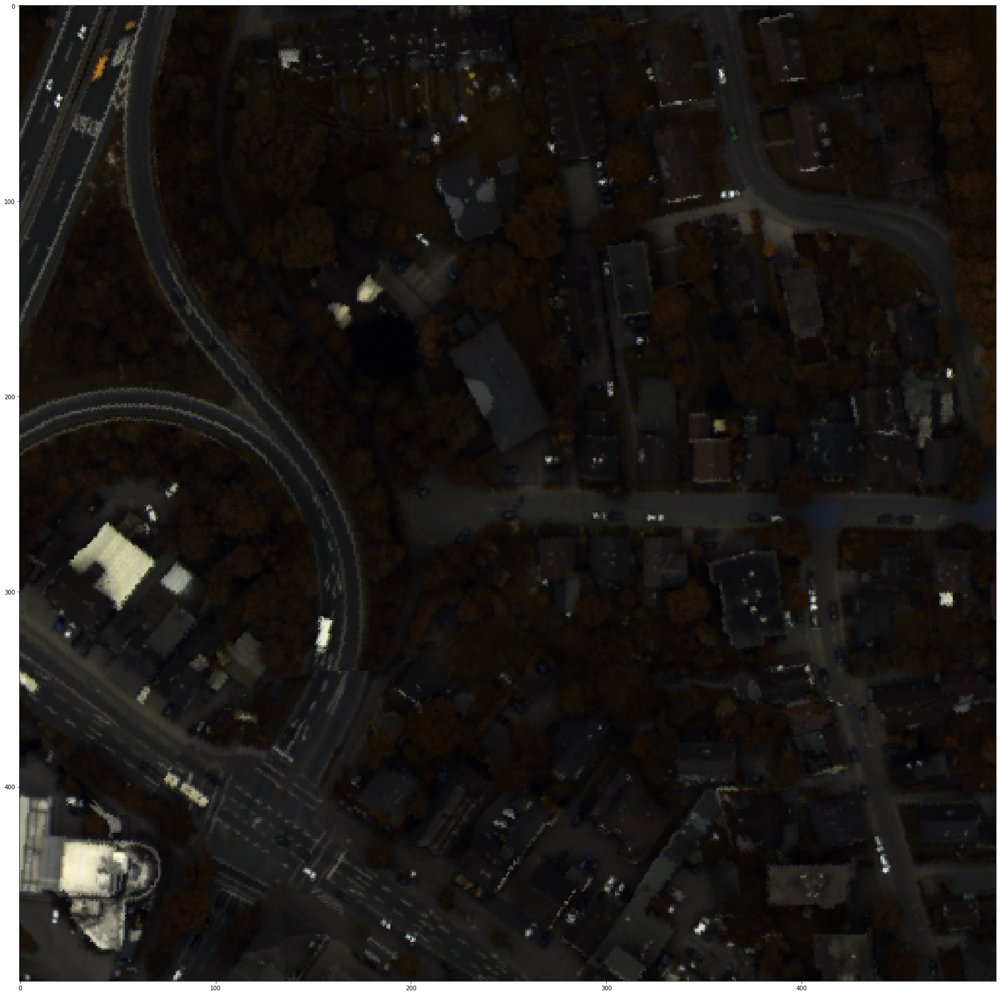

In [33]:
view = imshow(pixel,(27,21,4), figsize=(30,50))

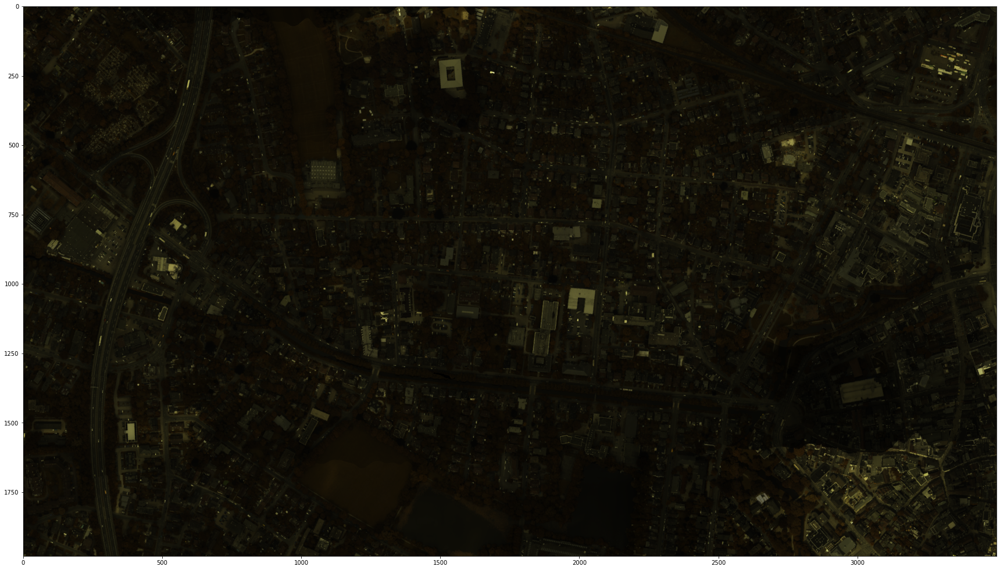

In [34]:
view = imshow(arr,(27,21,4), figsize=(30,50))



In [35]:
save_rgb(filename = 'Ausschnitt_Oldenburg_rgb.jpg', data = pixel, bands=(27,21,4))

In [36]:
save_rgb(filename = 'Oldenburg_rgb.jpg', data = arr, bands=(27,21,4))